In [1]:
import numpy as np

In [2]:
DATASET_TOP_LEFT_GPS = np.array((12.86308254761559, 77.5151947517078))
DATASET_TOP_RIGHT_GPS = np.array((12.863010715187013, 77.52267023737696))
DATASET_BOT_LEFT_GPS = np.array((12.859008245256549, 77.5151541499705))
DATASET_BOT_RIGHT_GPS = np.array((12.858936436333265, 77.52262951527761))

DATASET_CORNER_GPS_COORDS = DATASET_TOP_LEFT_GPS, DATASET_TOP_RIGHT_GPS, DATASET_BOT_LEFT_GPS, DATASET_BOT_RIGHT_GPS

DATASET_WIDTH = 14180
DATASET_HEIGHT = 7877

## Coordinate transformation functions

In [3]:
# Pixel to GPS transform for a single image. width and height are the width and height of image
def get_pixel_to_gps_transform(corner_gps_coords, width, height):
    top_left_gps, top_right_gps, bot_left_gps, bot_right_gps = corner_gps_coords
    right_vec = (top_right_gps - top_left_gps)/width
    bot_vec = (bot_left_gps - top_left_gps)/height

    transformation = np.array([[right_vec[0], bot_vec[0]], [right_vec[1], bot_vec[1]]])
    
    def transform(pixel):
        return transformation @ pixel + top_left_gps
    
    return transform

In [4]:
DATASET_PIXEL_TO_GPS_TRANSFORM = get_pixel_to_gps_transform(DATASET_CORNER_GPS_COORDS, DATASET_WIDTH, DATASET_HEIGHT)

In [5]:
import math

# CCW rotation
def rotate_point_about_origin(xy, radians):
    """Only rotate a point around the origin (0, 0)."""
    x, y = xy
    x_new = x * math.cos(radians) - y * math.sin(radians)
    y_new = x * math.sin(radians) + y * math.cos(radians)

    return x_new, y_new


def rotate_pixel_about_origin(xy, radians):
    return rotate_point_about_origin(xy, -radians)

def rotate_pixel_about_center(xy, center, radians):
    vector = np.array(xy) - np.array(center)
    return rotate_pixel_about_origin(vector, radians)

def transform_sample_pixel_coords_to_dataset_pixel_coords(xy, sample_center, radians, sample_dim):
    # Sample pixel coordinate system has (0,0) at the top left of the sample image
    sample_center_in_sample_pixel_coords = np.array((sample_dim[1]/2, sample_dim[0]/2))
    rotated_coords = rotate_pixel_about_center(xy, sample_center_in_sample_pixel_coords, radians)
    coords = rotated_coords + sample_center
    return coords

# sample_center is the sample center coordinates in the dataset pixel coordinate system    
def transform_sample_pixel_coords_to_gps_coords(xy, sample_center, radians, sample_dim):
    dataset_pixel_coords = transform_sample_pixel_coords_to_dataset_pixel_coords(xy, sample_center, radians, sample_dim)
    return DATASET_PIXEL_TO_GPS_TRANSFORM(dataset_pixel_coords)
    
# center is the center coordinates (np array) of the sample image in the dataset pixel coordinate system
# radians is the angle that the sample image coordinate system is rotated relative to the dataset
    # coordinate system (CCW)
# sample_dim is (height, width)
def get_corner_gps_coords_of_sample_img(center, radians, sample_dim):
    height = sample_dim[0]
    width = sample_dim[1]
    
    top_left_pixel = np.array((0,0))
    top_right_pixel = np.array((width,0))
    bot_left_pixel = np.array((0,height))
    bot_right_pixel = np.array((width,height))
    
    top_left_gps = transform_sample_pixel_coords_to_gps_coords(top_left_pixel, center, radians, sample_dim)
    top_right_gps = transform_sample_pixel_coords_to_gps_coords(top_right_pixel, center, radians, sample_dim)
    bot_left_gps = transform_sample_pixel_coords_to_gps_coords(bot_left_pixel, center, radians, sample_dim)
    bot_right_gps = transform_sample_pixel_coords_to_gps_coords(bot_right_pixel, center, radians, sample_dim)
    return (top_left_gps, top_right_gps, bot_left_gps, bot_right_gps)


## Layers

In [7]:
import os
import scipy.io
import scipy.misc
import numpy as np
import PIL
import struct
import cv2
from numpy import expand_dims
import tensorflow as tf
from keras import backend as K
from keras.layers import Input, Lambda, Conv2D, BatchNormalization, LeakyReLU, ZeroPadding2D, UpSampling2D
from keras.models import load_model, Model
from matplotlib import pyplot
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from matplotlib.patches import Rectangle

2023-03-27 14:01:58.005670: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-03-27 14:01:58.174813: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-03-27 14:01:58.176091: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-27 14:01:58.880715: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [8]:
class BoundBox:
    def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
        self.xmin = xmin
        self.ymin = ymin
        self.xmax = xmax
        self.ymax = ymax
        self.objness = objness
        self.classes = classes
        self.label = -1
        self.score = -1

    def get_label(self):
        if self.label == -1:
            self.label = np.argmax(self.classes)

        return self.label

    def get_score(self):
        if self.score == -1:
            self.score = self.classes[self.get_label()]
        return self.get_score

def _sigmoid(x):
    return 1. /(1. + np.exp(-x))

def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
    grid_h, grid_w = netout.shape[:2]
    nb_box = 3
    netout = netout.reshape((grid_h, grid_w, nb_box, -1))
    nb_class = netout.shape[-1] - 5
    boxes = []
    netout[..., :2]  = _sigmoid(netout[..., :2])
    netout[..., 4:]  = _sigmoid(netout[..., 4:])
    netout[..., 5:]  = netout[..., 4][..., np.newaxis] * netout[..., 5:]
    netout[..., 5:] *= netout[..., 5:] > obj_thresh
 
    for i in range(grid_h*grid_w):
        row = i / grid_w
        col = i % grid_w
        for b in range(nb_box):
            # 4th element is objectness score
            objectness = netout[int(row)][int(col)][b][4]
            if(objectness.all() <= obj_thresh): continue
            # first 4 elements are x, y, w, and h
            x, y, w, h = netout[int(row)][int(col)][b][:4]
            x = (col + x) / grid_w # center position, unit: image width
            y = (row + y) / grid_h # center position, unit: image height
            w = anchors[2 * b + 0] * np.exp(w) / net_w # unit: image width
            h = anchors[2 * b + 1] * np.exp(h) / net_h # unit: image height
            # last elements are class probabilities
            classes = netout[int(row)][col][b][5:]
            box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
            boxes.append(box)
    return boxes

In [9]:
def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
    new_w, new_h = net_w, net_h
    for i in range(len(boxes)):
        x_offset, x_scale = (net_w - new_w)/2./net_w, float(new_w)/net_w
        y_offset, y_scale = (net_h - new_h)/2./net_h, float(new_h)/net_h
#         print(f" {x_offset} {x_scale} {y_offset} {y_scale} {boxes[i].xmin} {boxes[i].xmax} {boxes[i].ymin} {boxes[i].ymax}")
        boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
        boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
        boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
        boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

In [10]:
def _interval_overlap(interval_a, interval_b):
    x1, x2 = interval_a
    x3, x4 = interval_b
    if x3 < x1:
        if x4 < x1:
            return 0
        else:
            return min(x2,x4) - x1
    else:
        if x2 < x3:
             return 0
        else:
            return min(x2,x4) - x3

def bbox_iou(box1, box2):
    intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
    intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
    intersect = intersect_w * intersect_h
    w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
    w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
    union = w1*h1 + w2*h2 - intersect
    return float(intersect) / union
 
def do_nms(boxes, nms_thresh):
    if len(boxes) > 0:
        nb_class = len(boxes[0].classes)
    else:
        return
    for c in range(nb_class):
        sorted_indices = np.argsort([-box.classes[c] for box in boxes])
        for i in range(len(sorted_indices)):
            index_i = sorted_indices[i]
            if boxes[index_i].classes[c] == 0: continue
            for j in range(i+1, len(sorted_indices)):
                index_j = sorted_indices[j]
                if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
                    boxes[index_j].classes[c] = 0

# get all of the results above a threshold
def get_boxes(boxes, labels, thresh):
    v_boxes, v_labels, v_scores = list(), list(), list()
    # enumerate all boxes
    for box in boxes:
        # enumerate all possible labels
        for i in range(len(labels)):
            # check if the threshold for this label is high enough
            if box.classes[i] > thresh:
                v_boxes.append(box)
                v_labels.append(labels[i])
                v_scores.append(box.classes[i]*100)
                # don't break, many labels may trigger for one box
    return v_boxes, v_labels, v_scores

# draw all results
def draw_boxes(filename, v_boxes, v_labels, v_scores):
  
    # load the image
    data = pyplot.imread(filename)
    # plot the image
    pyplot.imshow(data)
    # get the context for drawing boxes
    ax = pyplot.gca()
    # plot each box
    for i in range(len(v_boxes)):
        box = v_boxes[i]
        # get coordinates
        y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='red', linewidth = 1)
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (v_labels[i], v_scores[i])
        pyplot.text(x1, y1, label, color='red')
    # show the plot
    pyplot.show()

In [11]:
# anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
anchors = [[10,13, 16,30, 33,23], [30,61, 62,45, 59,119], [116,90, 156,198, 373,326]]

class_threshold = 0.6

labels = ["car", "truck", "bus", "minibus", "cyclist"]

In [12]:
from tensorflow import keras
import cv2
keras_model = keras.models.load_model('/home/matt/RT-Flight/yolo-test/yolov3.h5', compile=False)

In [13]:
from numpy import expand_dims
from keras.utils import load_img
from keras.utils import img_to_array
def load_image_pixels(filename, shape):
    # load the image to get its shape
    image = load_img(filename)
    width, height = image.size

    # load the image with the required size
    image = load_img(filename, target_size=shape) # convert to numpy array
    image = img_to_array(image)

    # scale pixel values to [0, 1]
    image = image.astype('float32')
    image /= 255.0

    # add a dimension so that we have one sample
    image = expand_dims(image, 0)
    return image, width, height

In [39]:
test_gcps_pixels = np.array([(650, 650), (1250, 650), (1100, 650)])

In [42]:
import mmcv

mmcv.collect_env()

from mmcv.runner import load_checkpoint
from mmdet.apis import inference_detector
from mmrotate.models import build_detector

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import rotate

import grpc
# import messaging_pb2
# import messaging_pb2_grpc

import os
import sys
import random
import cv2
import time

import torch

# (height, width)
OUTPUT_DIM = (600,600)

class ImageProcessingLayer:
    def __init__(
        self,
        mock=True,
        mock_image_path=None,
        mock_num_samples=10,
        mock_wait_time=1,
    ):
        self.mock = mock

        if not mock:
            return

        self.mock_wait_time = mock_wait_time

        if mock_image_path is None:
            mock_image_path = "/home/matt/RT-Flight/yolo-test/test-aerial-image.jpg"

        self._mock_img_full = np.asarray(Image.open(mock_image_path))
        self._output_dim = OUTPUT_DIM
        diag_len = np.sqrt(self._output_dim[0] ** 2 + self._output_dim[1] ** 2)
#         self._gcps_pixels = self._generate_random_gcps(
#             self._mock_img_full, mock_num_samples, padding=(diag_len, diag_len)
#         )
        self._gcps_pixels = test_gcps_pixels
        
        # maybe convert from pixels to lat/lon here

        self._path_pixels = self._build_path_pixels(self._gcps_pixels)

    def _generate_random_gcps(self, img, num_samples, padding=(0, 0)):
        return np.random.randint(
            padding,
            high=(img.shape[1] - padding[0], img.shape[0] - padding[1]),
            size=(num_samples, 2),
        )

    def _build_path_pixels(self, gcps):
        STEP_SIZE = 90
        
        delta = np.diff(gcps, axis=0)
        directions = delta / np.linalg.norm(delta, axis=1).reshape(-1, 1)
        angles = -np.arctan2(directions.T[1], directions.T[0]) * 180 / np.pi
        delta_angles = np.append(np.diff(angles), 0)

        path = []

        for t1, t2, angle, delta_angle in zip(gcps, gcps[1:], angles, delta_angles):
            steps = np.linalg.norm(t2 - t1) / STEP_SIZE
            line = np.linspace(t1, t2, steps.astype("uint32"), dtype="uint32")
            path.extend([np.array([x, y, angle]) for x, y in line])

            if delta_angle == 0:
                continue

            if len(line) == 0:
                continue

            interpolated_angles = np.linspace(angle, angle + delta_angle, 3)
            path.extend(
                [
                    np.array([line[-1][0], line[-1][1], theta])
                    for theta in interpolated_angles
                ]
            )

        return path

    def _next_image(self):
        if self.mock_wait_time > 0:
            time.sleep(self.mock_wait_time)

        sample_diag = np.sqrt(self._output_dim[0] ** 2 + self._output_dim[1] ** 2)

        for x, y, theta in self._path_pixels:
            sample = self._crop_around(
                self._mock_img_full, (y, x), (sample_diag, sample_diag)
            )
            rotated_img = self._center_crop(
                rotate(sample, -theta, reshape=False), self._output_dim
            )
          
            theta_radians = theta / 180 * math.pi
            
            center = np.array((x, y))
            
            corner_gps_coords = get_corner_gps_coords_of_sample_img(center, theta_radians, self._output_dim)
            
            yield rotated_img, corner_gps_coords

    def _crop_around(self, img, center, dim):
        dim = np.array(dim).astype("uint32")
        x = int(center[1] - dim[1] // 2)
        y = int(center[0] - dim[0] // 2)
        return img[y : y + dim[0], x : x + dim[1]]

    def _center_crop(self, img, dim):
        return img[
            img.shape[0] // 2 - dim[0] // 2 : img.shape[0] // 2 + dim[0] // 2,
            img.shape[1] // 2 - dim[1] // 2 : img.shape[1] // 2 + dim[1] // 2,
        ]

    def run(self, img=None):
        if not self.mock:
            assert img is not None, "Image cannot be None"
            return img

        return self._next_image()


    
class KerasObjectDetectionLayer:
    def __init__(
        self, config_file=None, checkpoint_file=None, device=torch.device('cpu'), min_confidence=0.3
    ):
        self.device = device
        self.model = keras_model
        
    
    def _get_bboxes_pixels(self, img):
        image_w = img.shape[1]
        image_h = img.shape[0]
        
        from PIL import Image
        im = Image.fromarray(img)

        im1 = im.resize((416, 416))
        im1 = np.asarray(im1)
        img = im1
#         print(img.shape)
        img = img.reshape((1, 416, 416, 3))
        img = img.astype('float32')
        img /= 255.0
        
        # define the expected input shape for the model
        input_w, input_h = 416, 416
       
        # make prediction
        yhat = keras_model.predict(img)
        # define the anchors
        anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
        # define the probability threshold for detected objects
        class_threshold = 0.7
        boxes = list()
        for i in range(len(yhat)):
            # decode the output of the network
            boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)
        # correct the sizes of the bounding boxes for the shape of the image
#         print(f"{image_h} {image_w} {input_h} {input_w}")
#         for box in boxes:
#             print(f"{box.xmin} {box.xmax} {box.ymin} {box.ymax}")
            
        correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
        # suppress non-maximal boxes
        do_nms(boxes, 0.4)
        # define the labels
        labels = ["car", "truck", "bus", "minibus", "cyclist"]
        v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
        # summarize what we found
        
        bboxes = []
        for index, box in enumerate(v_boxes):
            bbox = []
            bbox.append(box.ymin)
            bbox.append(box.ymax)
            bbox.append(box.xmin)
            bbox.append(box.xmax)
            bbox.append(v_scores[index])
            bboxes.append(bbox)
        return bboxes

    def run(self, img):
        result = self._get_bboxes_pixels(img)

        # convert pixels to lat/lon here
        return result


    

# class KerasObjectDetectionLayerTest:
#     def __init__(
#         self, config_file=None, checkpoint_file=None, device=torch.device('cpu'), min_confidence=0.3
#     ):
#         self.device = device
#         self.model = keras_model
        
    
#     def _get_bboxes_pixels(self, img):
#         image_w = img.shape[1]
#         image_h = img.shape[0]
        
#         from PIL import Image
#         im = Image.fromarray(img)

#         im1 = im.resize((416, 416))
#         im1 = np.asarray(im1)
#         img = im1
# #         print(img.shape)
#         plt.imshow(img)
#         plt.show()
#         img = img.reshape((1, 416, 416, 3))
#         img = img.astype('float32')
#         img /= 255.0
        
#         # define the expected input shape for the model
#         input_w, input_h = 416, 416
       
#         # make prediction
#         layerOutputs = keras_model.predict(img)
#         # define the anchors
#         anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
#         # define the probability threshold for detected objects
#         threshold = 0.7
        
        
#         W = image_w
#         H = image_h
        
#         boxes = []
#         confidences = []
#         classIDs = []
#         for output in layerOutputs:
#         # loop over each of the detections
#             for detection in output:
#                 print(detection.shape)
#                 print(detection)
#                 # extract the class ID and confidence (i.e., probability) of
#                 # the current object detection
#                 scores = detection[5:]
#                 print(scores.shape)
#                 print(np.argmax(scores))
#                 classID = np.argmax(scores)
#                 confidence = scores.flatten()[classID]

#                 # filter out weak predictions by ensuring the detected
#                 # probability is greater than the minimum probability
#                 if confidence > threshold:
#                     # scale the bounding box coordinates back relative to the
#                     # size of the image, keeping in mind that YOLO actually
#                     # returns the center (x, y)-coordinates of the bounding
#                     # box followed by the boxes' width and height
#                     box = detection[0:4] * np.array([W, H, W, H])
#                     (centerX, centerY, width, height) = box.astype("int")

#                     # use the center (x, y)-coordinates to derive the top and
#                     # and left corner of the bounding box
#                     x = int(centerX - (width / 2))
#                     y = int(centerY - (height / 2))

#                     # update our list of bounding box coordinates, confidences,
#                     # and class IDs
#                     boxes.append([x, y, int(width), int(height)])
#                     confidences.append(float(confidence))
#                     classIDs.append(classID)
#         idxs = cv2.dnn.NMSBoxes(boxes, confidences, confidence, threshold)
#         #results are stored in idxs,boxes,confidences,classIDs
        
        
        
        
        
        
#         labels = ["car", "truck", "bus", "minibus", "cyclist"]
#         v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
#         # summarize what we found
        
#         bboxes = []
#         for index, box in enumerate(v_boxes):
#             bbox = []
#             bbox.append(box.ymin)
#             bbox.append(box.ymax)
#             bbox.append(box.xmin)
#             bbox.append(box.xmax)
#             bbox.append(v_scores[index])
#             bboxes.append(bbox)
#         return bboxes

#     def run(self, img):
#         result = self._get_bboxes_pixels(img)

#         # convert pixels to lat/lon here
#         return result
    
    
    
    
class MavlinkInterfaceLayer:
    def __init__(self, protos_path="pipelined_grpc/protos"):
        self.protos_path = protos_path
        self.channel = grpc.insecure_channel("localhost:50051")
        pass

    def run(self, bboxes):
        if len(bboxes) == 0:
            return

        print(bboxes)

In [17]:
# theta_radians = angle / 180 * math.pi
# bb = transform_rotated_sample_pixel_coords_to_gps_coords(np.array((1500,1500)), np.array(center), theta_radians, OUTPUT_DIM)

## Run the pipeline

showing rotated image
(600, 600, 3)


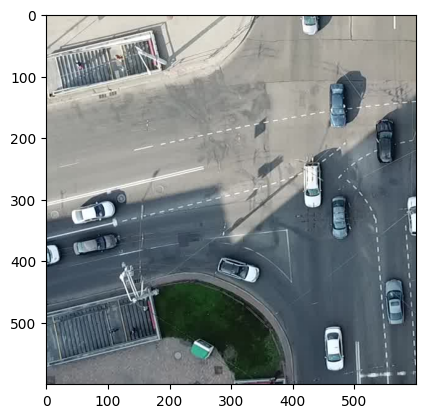

1/1 [==============================] - 0s 157ms/step
[[116, 205, 448, 501, 96.26497030258179], [173, 278, 523, 578, 99.88183379173279], [245, 334, 412, 451, 95.5560564994812], [290, 356, 47, 117, 99.92557764053345], [304, 388, 454, 497, 99.52608346939087], [396, 456, 276, 350, 97.2424328327179], [446, 529, 543, 590, 99.46608543395996], [512, 601, 444, 488, 95.62084078788757], [5, 41, 414, 449, 99.42895174026489], [309, 367, 585, 600, 94.35185194015503], [357, 390, 43, 121, 99.90617632865906], [369, 417, -2, 27, 77.37723588943481]]
(600, 600, 3)
116  205 448 501


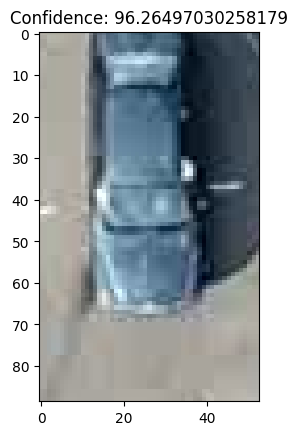

173  278 523 578


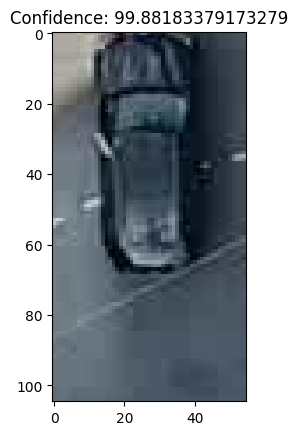

245  334 412 451


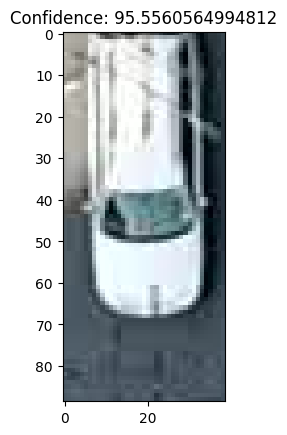

290  356 47 117


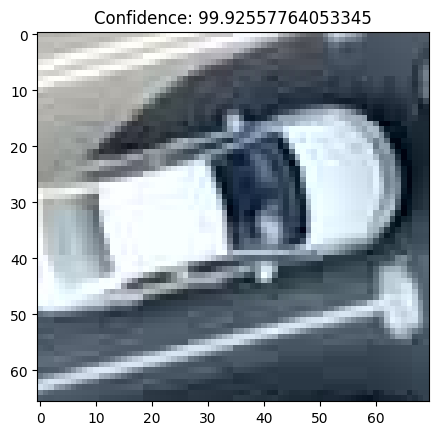

304  388 454 497


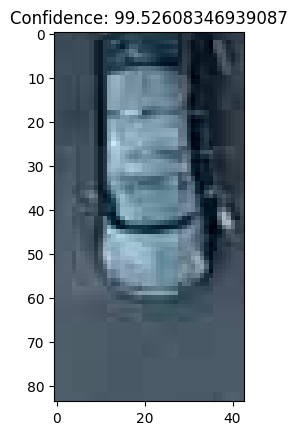

396  456 276 350


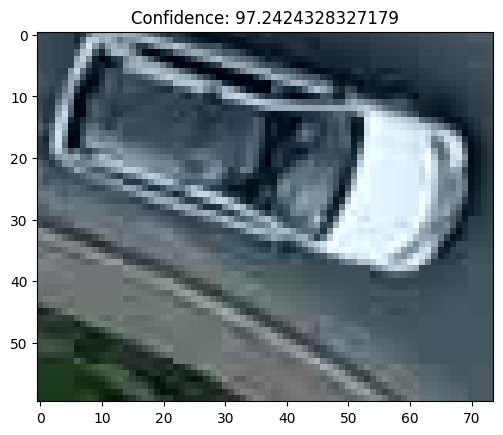

446  529 543 590


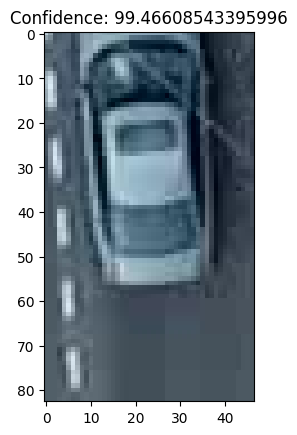

512  601 444 488


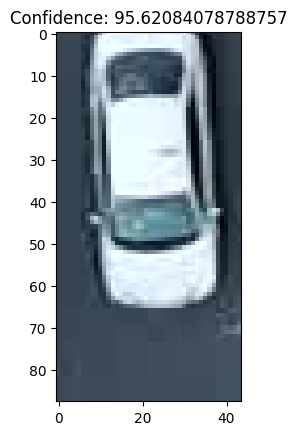

5  41 414 449


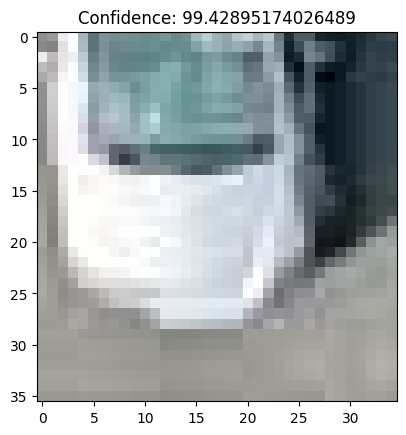

309  367 585 600


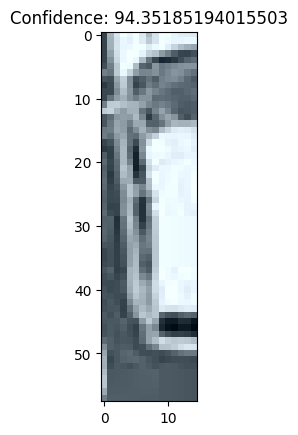

357  390 43 121


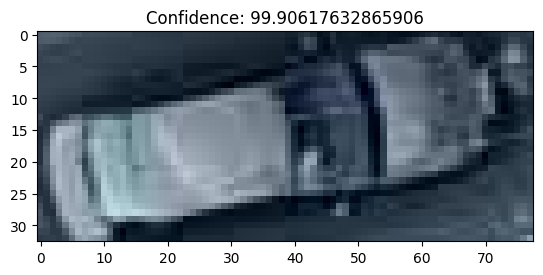

369  417 0 27


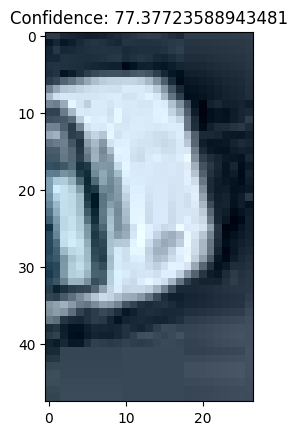

showing rotated image
(600, 600, 3)


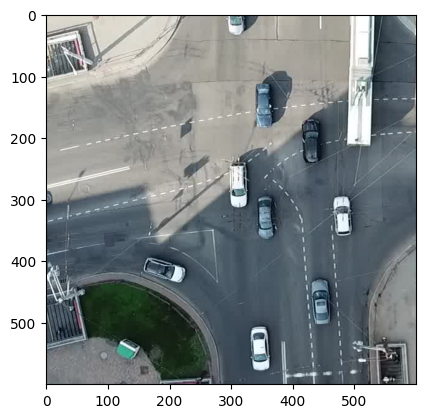

1/1 [==============================] - 0s 170ms/step
[[111, 203, 329, 379, 93.56091022491455], [170, 273, 408, 455, 99.71776008605957], [242, 329, 294, 333, 92.01817512512207], [297, 386, 337, 379, 99.69502091407776], [394, 455, 155, 227, 97.35019207000732], [438, 528, 424, 470, 99.71483945846558], [508, 595, 326, 368, 88.65963220596313], [2, 41, 295, 331, 79.09952402114868], [286, 316, -1, 9, 77.00042724609375], [303, 366, 463, 500, 98.2445240020752]]
(600, 600, 3)
111  203 329 379


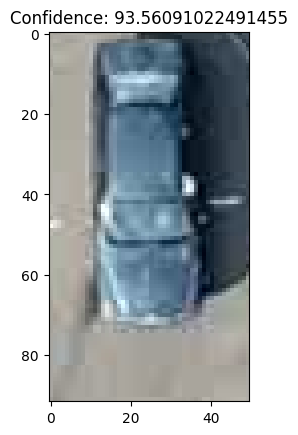

170  273 408 455


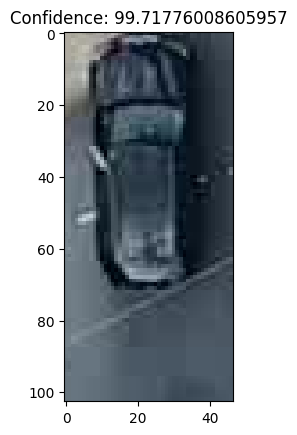

242  329 294 333


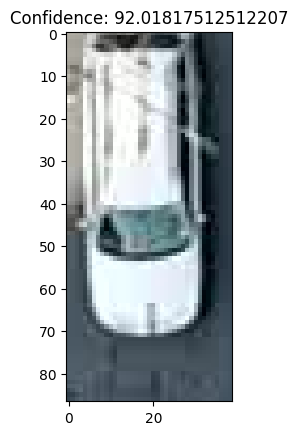

297  386 337 379


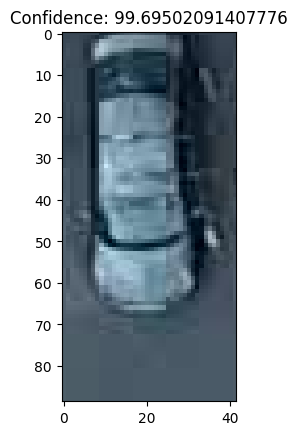

394  455 155 227


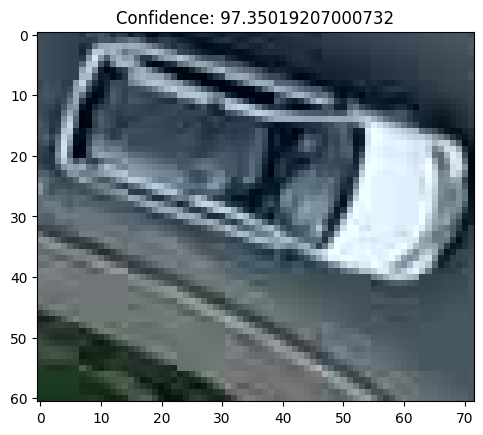

438  528 424 470


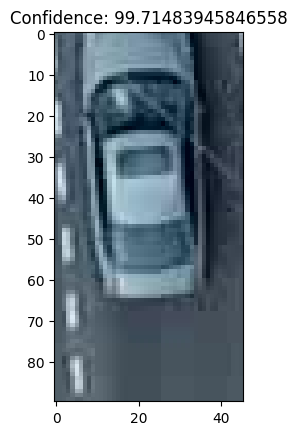

508  595 326 368


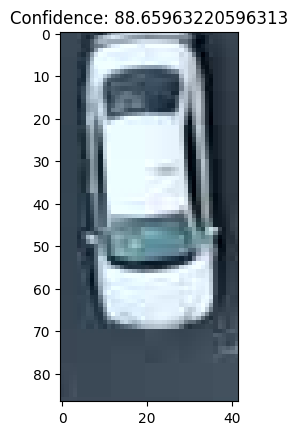

2  41 295 331


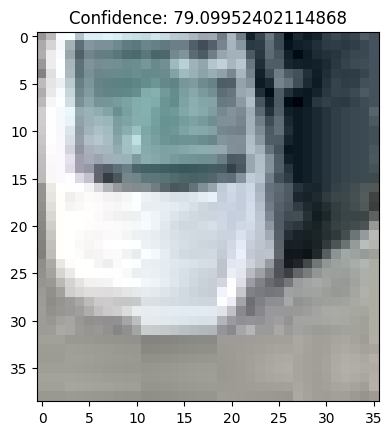

286  316 0 9


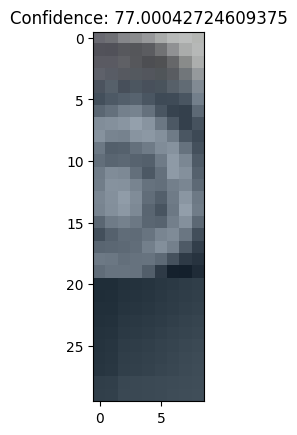

303  366 463 500


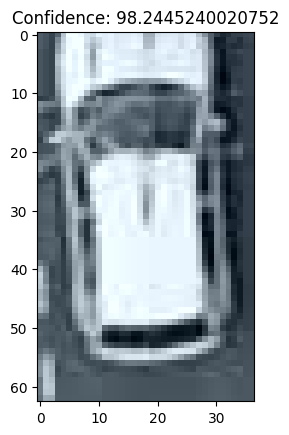

showing rotated image
(600, 600, 3)


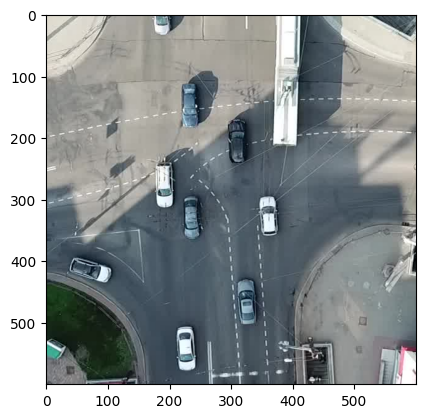

1/1 [==============================] - 0s 161ms/step
[[61, 219, 351, 420, 87.83795833587646], [106, 198, 209, 259, 95.29232978820801], [165, 267, 288, 334, 99.52588677406311], [238, 323, 175, 211, 86.68087720870972], [291, 382, 216, 258, 99.80660676956177], [298, 380, 338, 384, 97.22250699996948], [384, 448, 33, 111, 94.38234567642212], [433, 524, 306, 347, 99.73862171173096], [508, 589, 202, 249, 89.35137391090393], [1, 37, 173, 206, 98.93399477005005]]
(600, 600, 3)
61  219 351 420


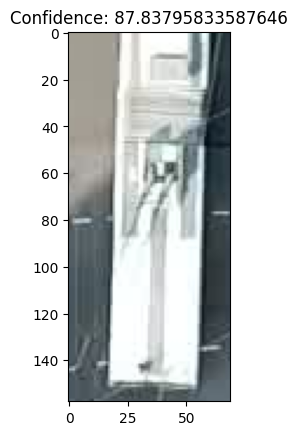

106  198 209 259


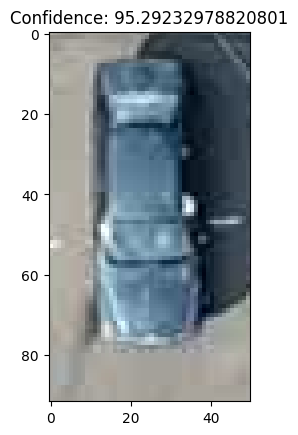

165  267 288 334


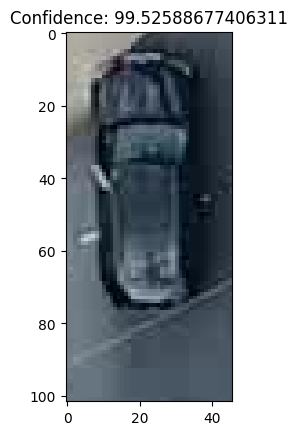

238  323 175 211


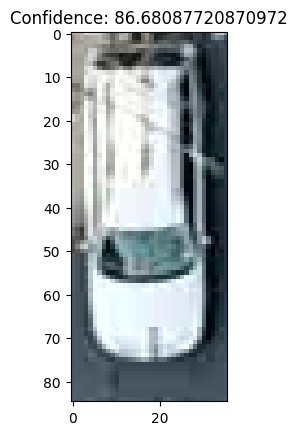

291  382 216 258


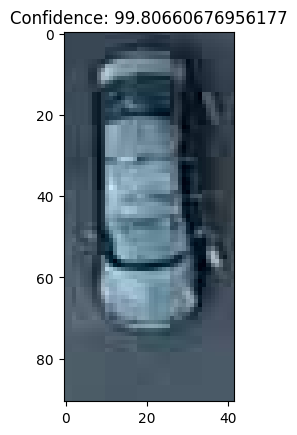

298  380 338 384


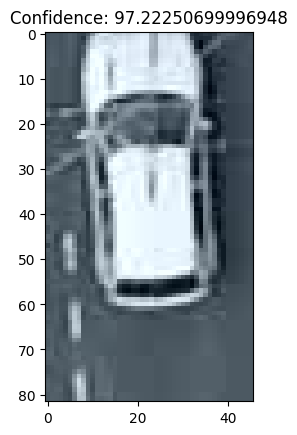

384  448 33 111


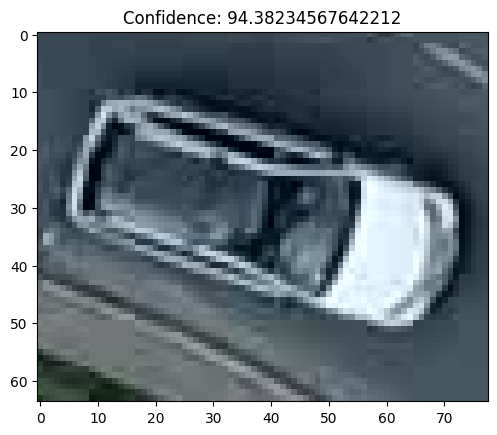

433  524 306 347


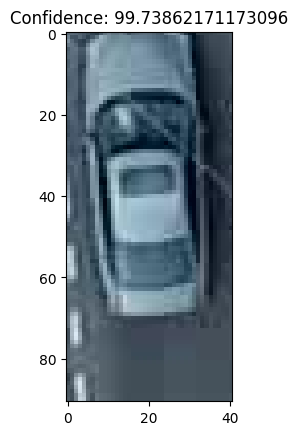

508  589 202 249


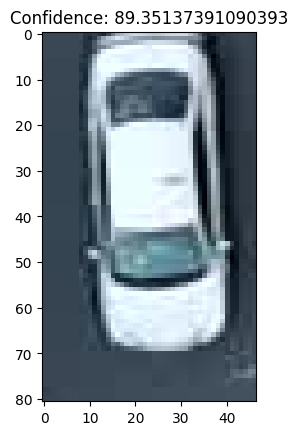

1  37 173 206


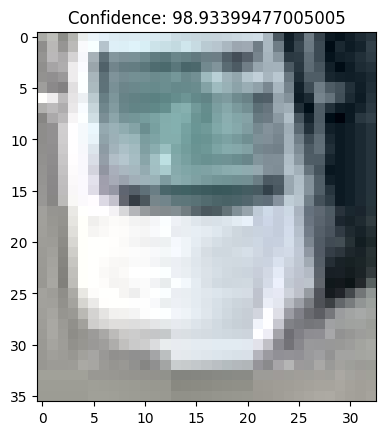

showing rotated image
(600, 600, 3)


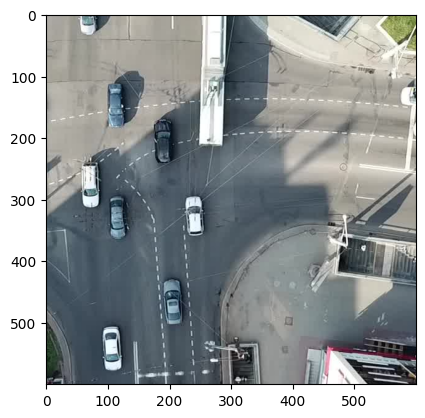

1/1 [==============================] - 0s 168ms/step
[[44, 220, 232, 300, 87.1508240699768], [104, 189, 85, 141, 91.8111264705658], [164, 261, 166, 213, 99.41666722297668], [284, 378, 98, 136, 99.7229814529419], [294, 376, 219, 265, 96.8569278717041], [430, 515, 181, 230, 99.53193664550781], [502, 586, 83, 128, 97.49268889427185], [-3, 36, 53, 90, 96.1797833442688], [125, 161, 577, 601, 91.50351285934448]]
(600, 600, 3)
44  220 232 300


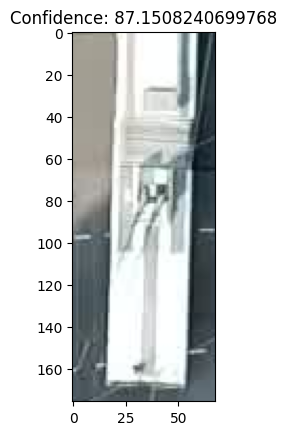

104  189 85 141


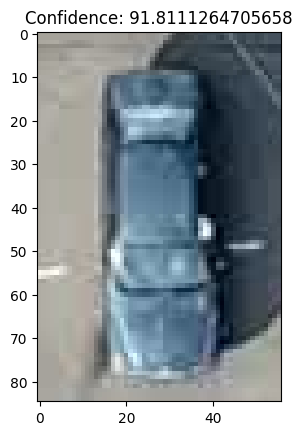

164  261 166 213


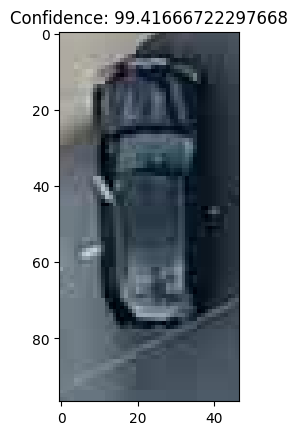

284  378 98 136


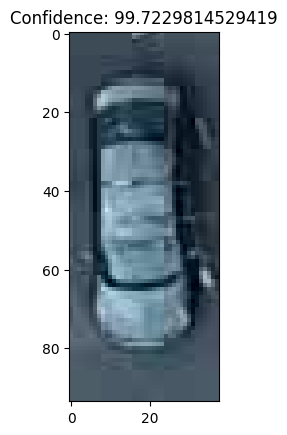

294  376 219 265


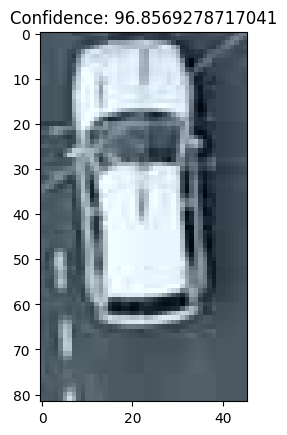

430  515 181 230


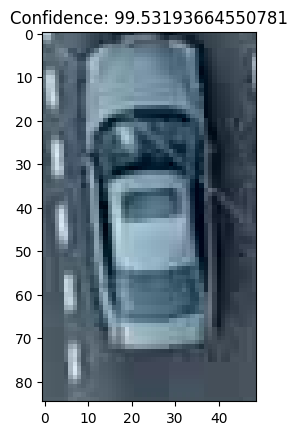

502  586 83 128


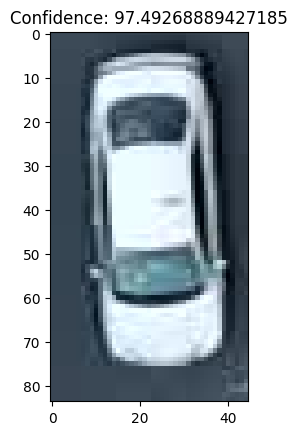

0  36 53 90


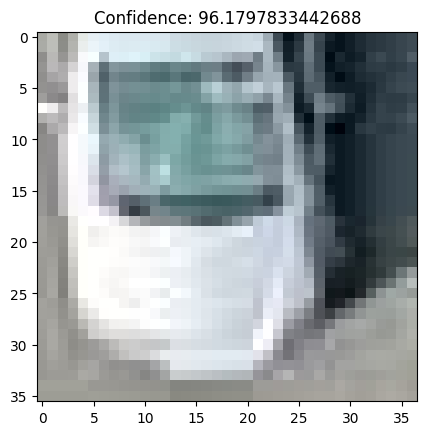

125  161 577 601


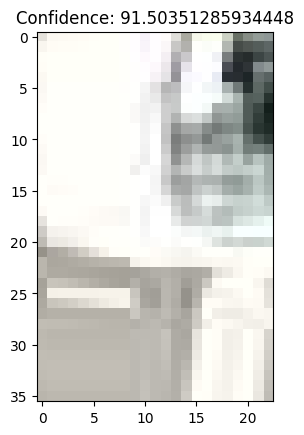

showing rotated image
(600, 600, 3)


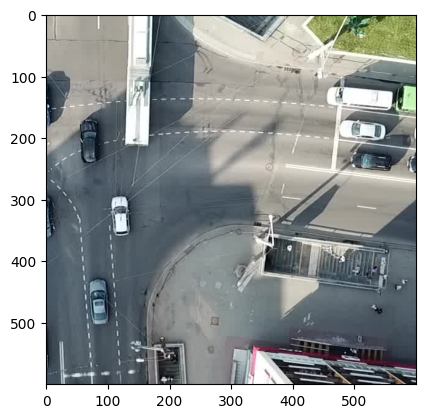

1/1 [==============================] - 0s 163ms/step
[[39, 218, 112, 177, 81.76490068435669], [128, 179, 474, 566, 93.0687427520752], [159, 255, 49, 92, 99.18641448020935], [288, 373, 101, 144, 98.71267676353455], [426, 513, 60, 110, 99.75894689559937], [109, 176, -2, 9, 73.25252890586853], [183, 212, 484, 548, 99.99356269836426], [291, 365, -2, 13, 96.27816081047058]]
(600, 600, 3)
39  218 112 177


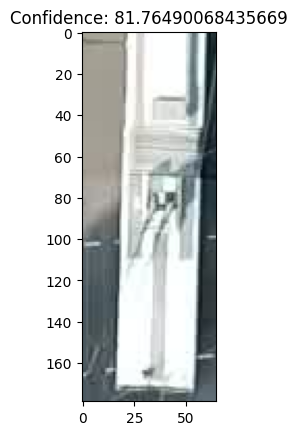

128  179 474 566


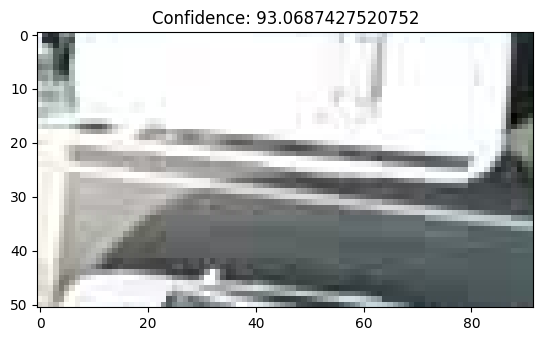

159  255 49 92


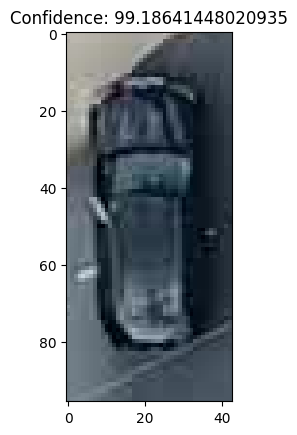

288  373 101 144


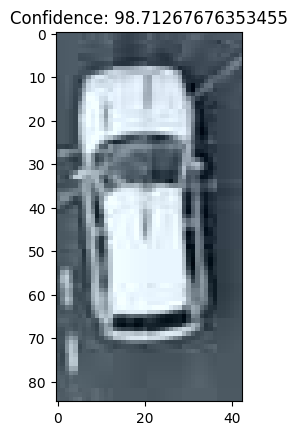

426  513 60 110


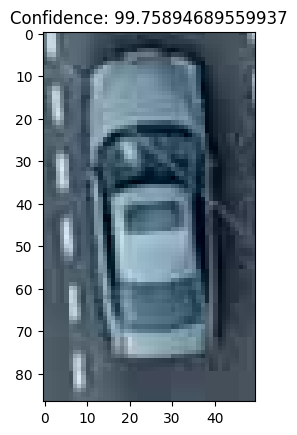

109  176 0 9


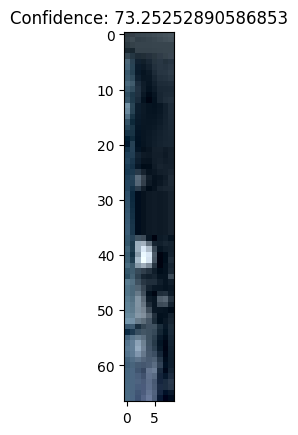

183  212 484 548


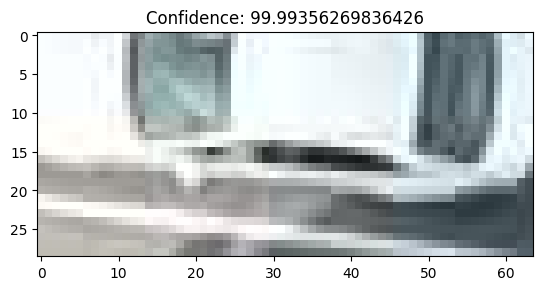

291  365 0 13


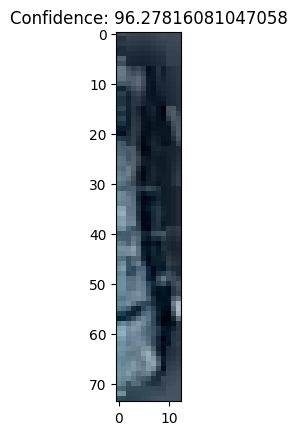

showing rotated image
(600, 600, 3)


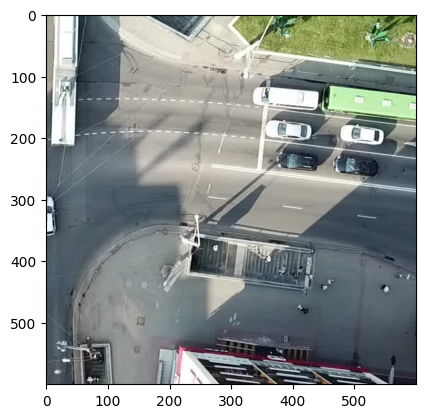

1/1 [==============================] - 0s 163ms/step
[[147, 186, 437, 597, 76.63896679878235], [180, 209, 360, 428, 99.99417066574097], [191, 216, 488, 541, 99.96030330657959], [236, 271, 465, 540, 99.74210262298584], [293, 357, -3, 20, 97.59458899497986]]
(600, 600, 3)
147  186 437 597


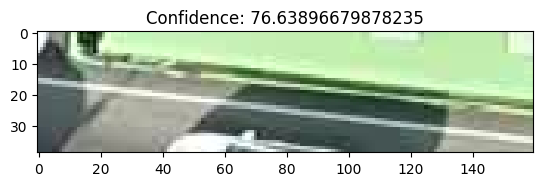

180  209 360 428


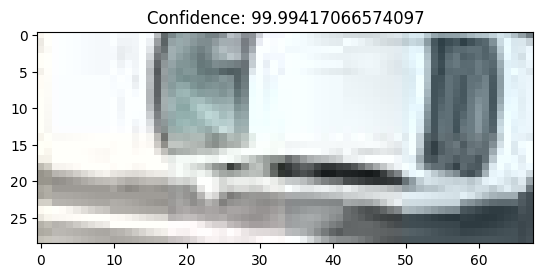

191  216 488 541


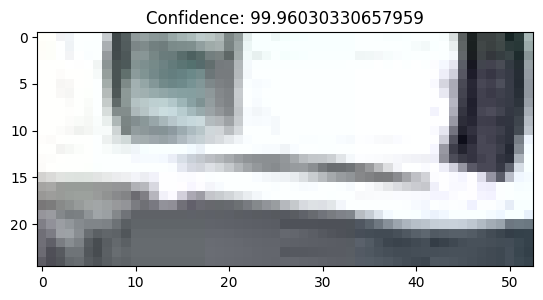

236  271 465 540


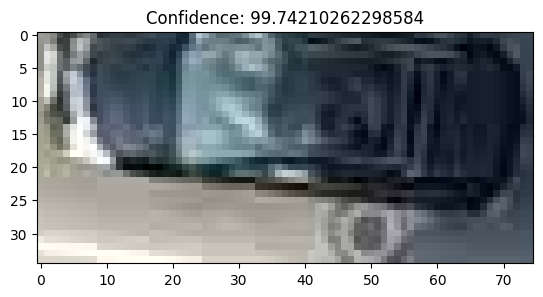

293  357 0 20


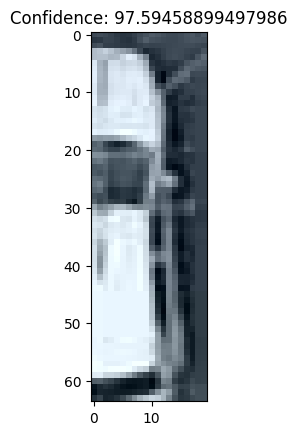

showing rotated image
(600, 600, 3)


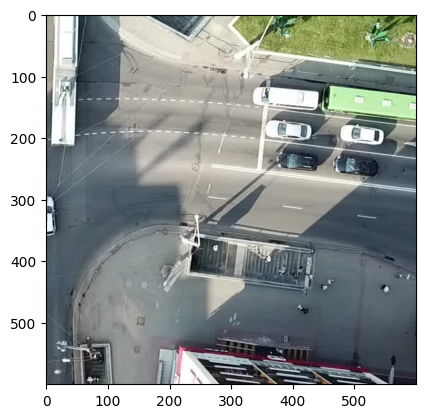

1/1 [==============================] - 0s 166ms/step
[[147, 186, 437, 597, 76.63896679878235], [180, 209, 360, 428, 99.99417066574097], [191, 216, 488, 541, 99.96030330657959], [236, 271, 465, 540, 99.74210262298584], [293, 357, -3, 20, 97.59458899497986]]
(600, 600, 3)
147  186 437 597


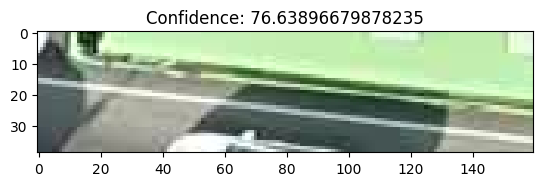

180  209 360 428


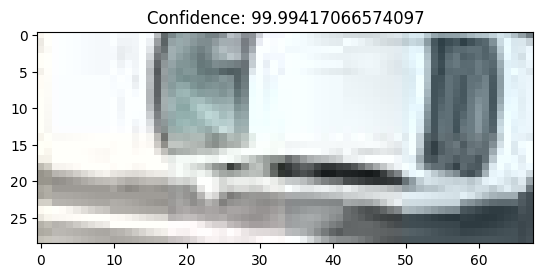

191  216 488 541


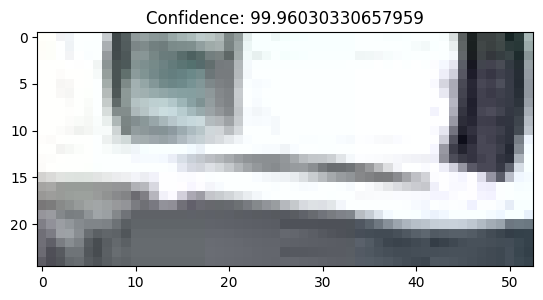

236  271 465 540


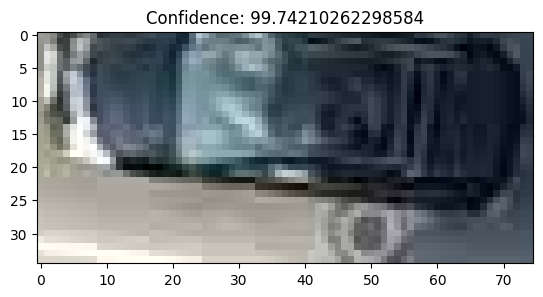

293  357 0 20


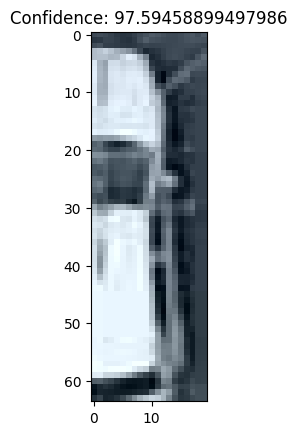

showing rotated image
(600, 600, 3)


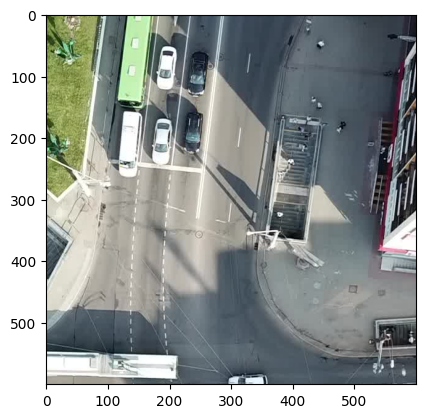

1/1 [==============================] - 0s 159ms/step
[[52, 124, 172, 215, 97.58670330047607], [157, 262, 161, 211, 84.34733152389526], [589, 603, 298, 358, 98.6674427986145]]
(600, 600, 3)
52  124 172 215


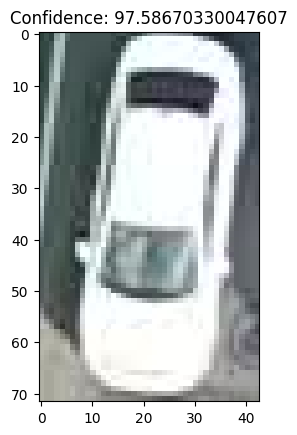

157  262 161 211


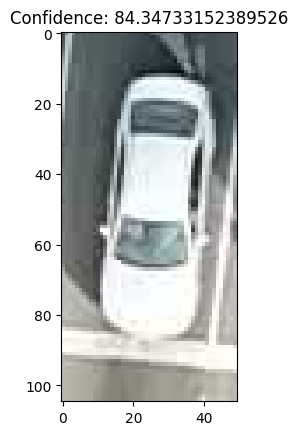

589  603 298 358


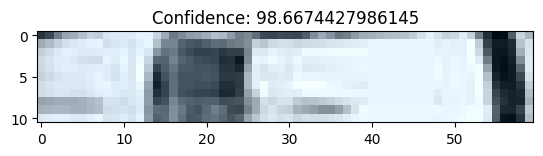

showing rotated image
(600, 600, 3)


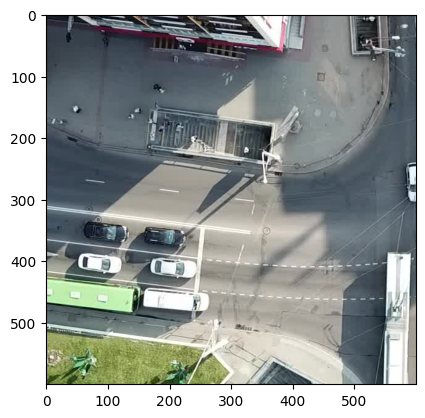

1/1 [==============================] - 0s 164ms/step
[[250, 313, 582, 600, 99.17190074920654], [335, 370, 59, 130, 99.91149306297302], [348, 380, 156, 222, 99.96128678321838], [391, 420, 50, 123, 99.48254823684692], [394, 431, 167, 240, 99.7453510761261]]
(600, 600, 3)
250  313 582 600


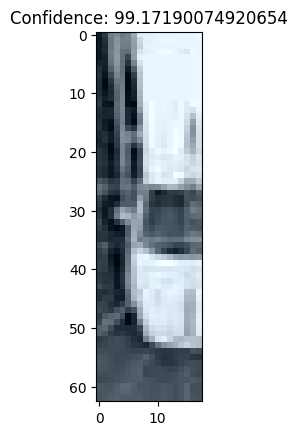

335  370 59 130


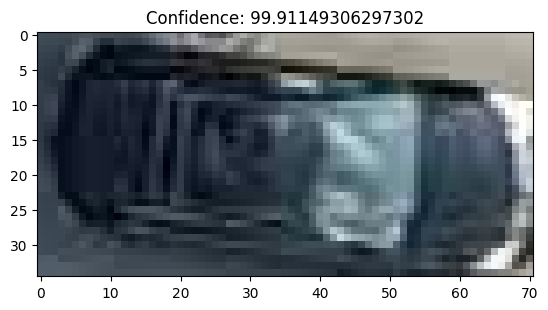

348  380 156 222


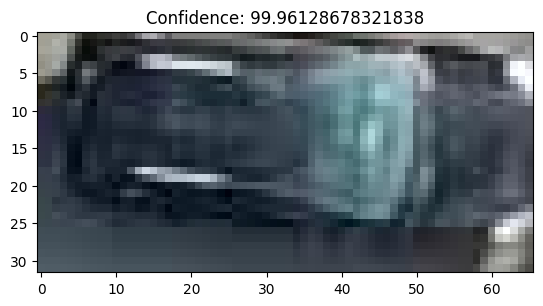

391  420 50 123


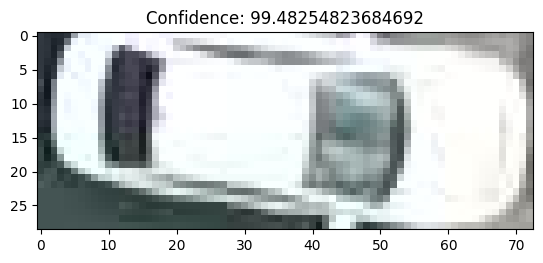

394  431 167 240


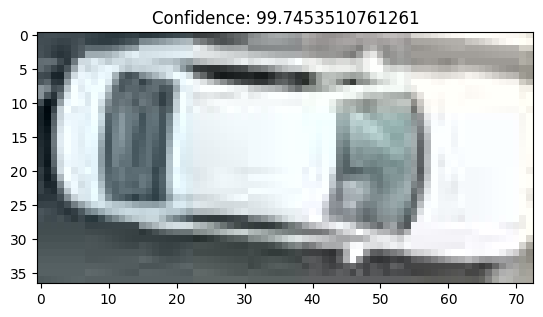

showing rotated image
(600, 600, 3)


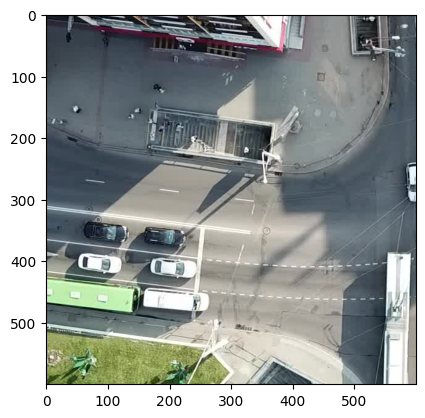

1/1 [==============================] - 0s 160ms/step
[[250, 313, 582, 600, 99.17190074920654], [335, 370, 59, 130, 99.91149306297302], [348, 380, 156, 222, 99.96128678321838], [391, 420, 50, 123, 99.48254823684692], [394, 431, 167, 240, 99.7453510761261]]
(600, 600, 3)
250  313 582 600


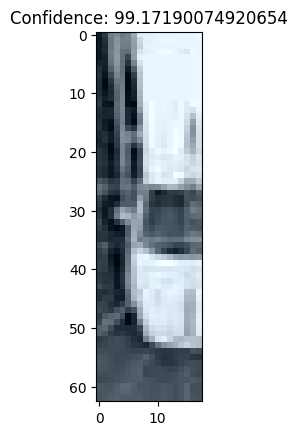

335  370 59 130


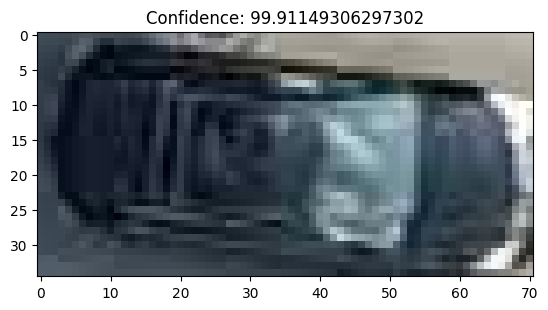

348  380 156 222


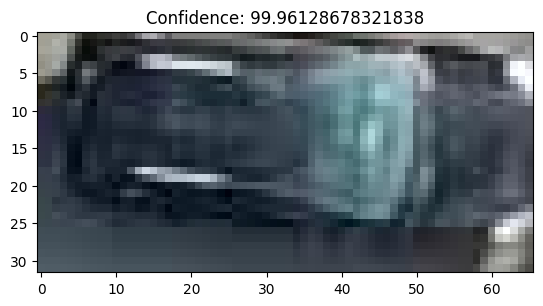

391  420 50 123


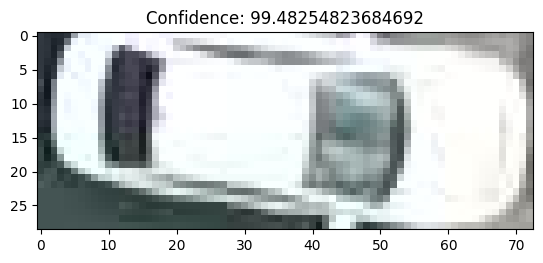

394  431 167 240


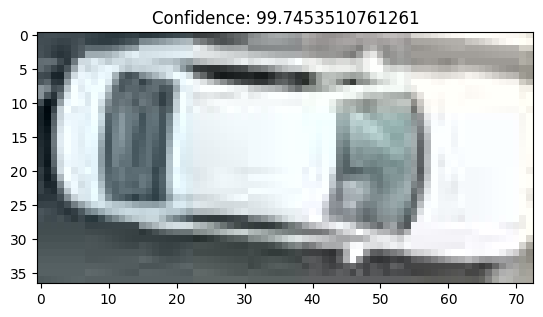

In [45]:
img_layer = ImageProcessingLayer(mock_wait_time=1)
# obj_layer = KerasObjectDetectionLayerTest()
obj_layer = KerasObjectDetectionLayer()
mav_layer = MavlinkInterfaceLayer()

detections = []

index = 0
for img, img_corner_gps_coords in img_layer.run():
    print("showing rotated image")
    print(img.shape)
    plt.imshow(img)
    plt.show()
    
    index = index + 1
    if index == 20:
        break
        
    bboxes = obj_layer.run(img)
#     mav_layer.run(bboxes)
    
    detections.append((img_corner_gps_coords, bboxes))
    print(bboxes)
    print(img.shape)
    for bbox in bboxes:
        # HACK: some bounding boxes return coordinates outside of image size (such as negative coordinates)
        for index, val in enumerate(bbox):
            if val < 0:
                bbox[index] = 0
        print(f"{bbox[0]}  {bbox[1]} {bbox[2]} {bbox[3]}")
        plt.imshow(img[bbox[0]:bbox[1], bbox[2]:bbox[3]])
        plt.title("Confidence: {}".format(bbox[4]))
        plt.show()

showing rotated image


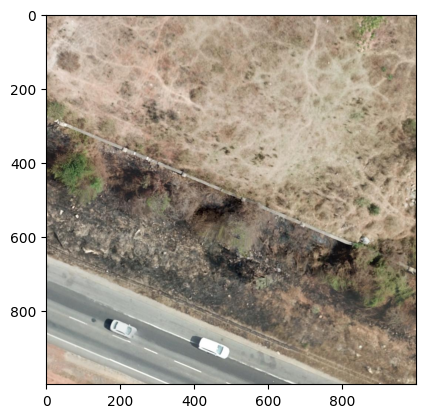

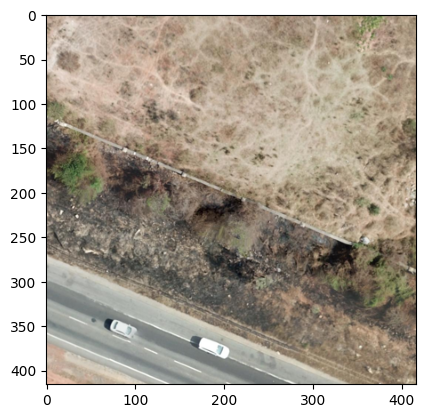

1/1 [==============================] - 0s 167ms/step
[[826, 879, 169, 247, 99.98844861984253], [891, 936, 415, 494, 99.39301013946533]]
(1000, 1000, 3)


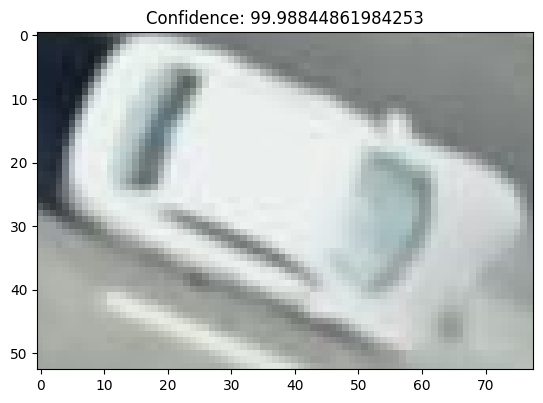

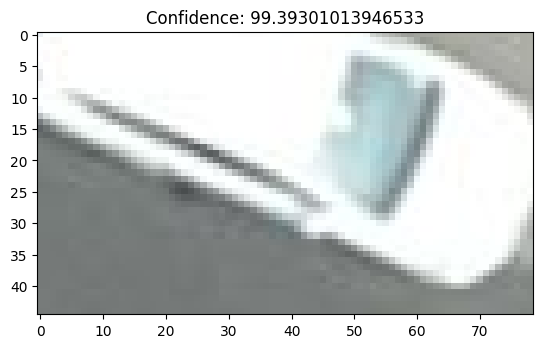

showing rotated image


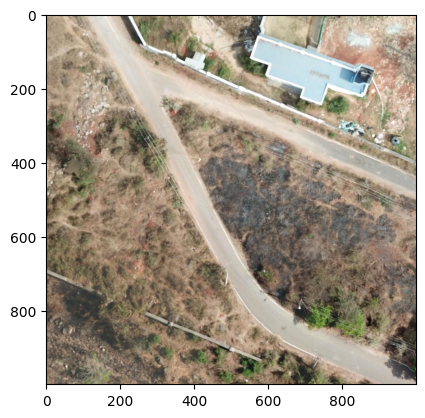

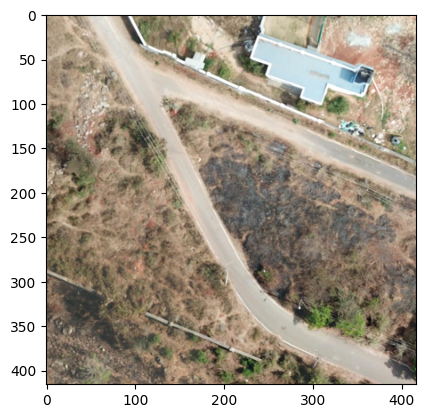

1/1 [==============================] - 0s 170ms/step
[]
(1000, 1000, 3)
showing rotated image


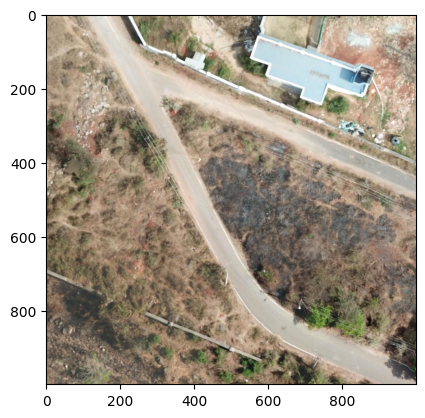

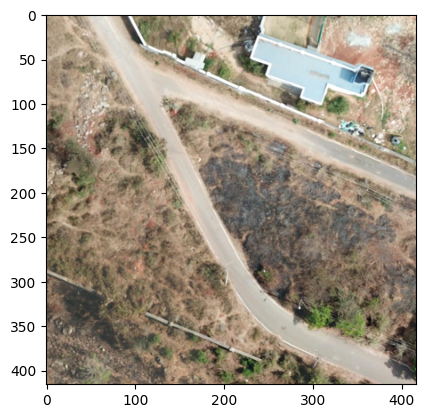

1/1 [==============================] - 0s 165ms/step
[]
(1000, 1000, 3)
showing rotated image


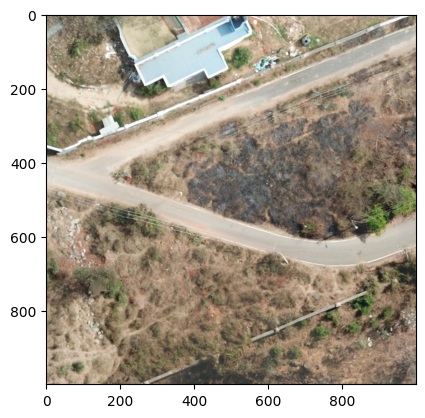

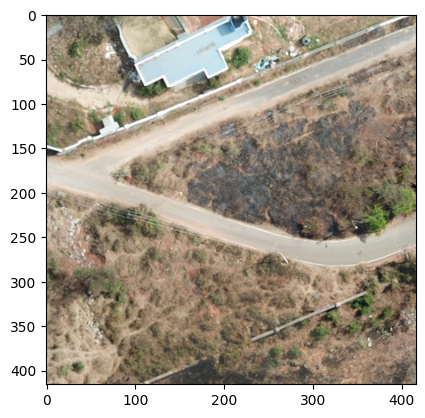

1/1 [==============================] - 0s 163ms/step
[[15, 55, 470, 542, 95.44820785522461], [138, 162, 568, 605, 88.60916495323181]]
(1000, 1000, 3)


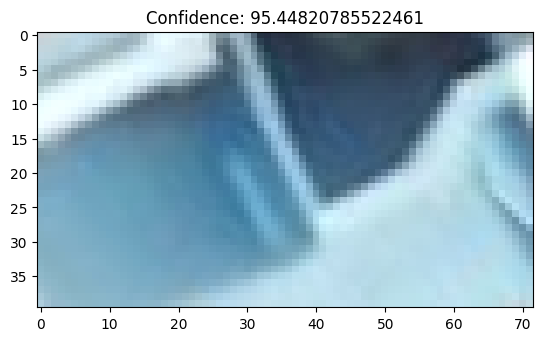

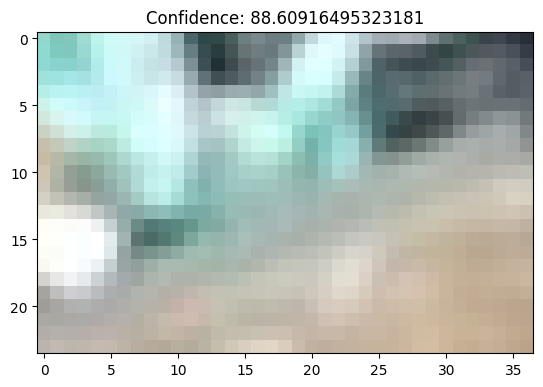

showing rotated image


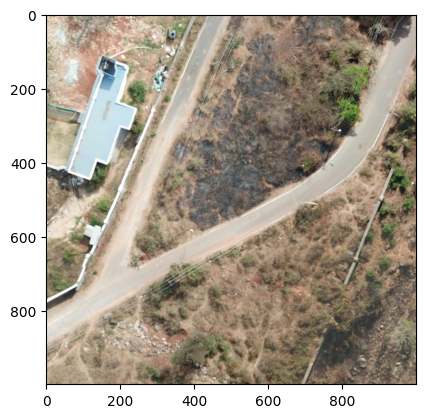

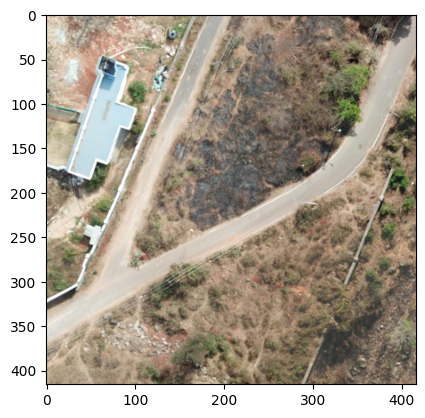

1/1 [==============================] - 0s 165ms/step
[]
(1000, 1000, 3)
showing rotated image


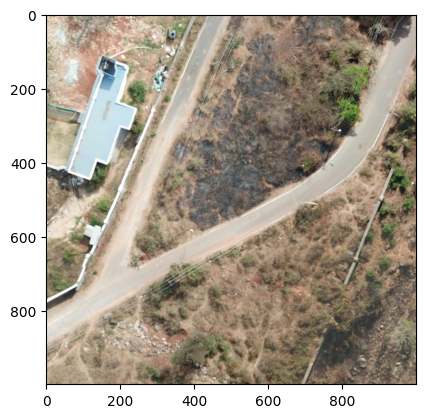

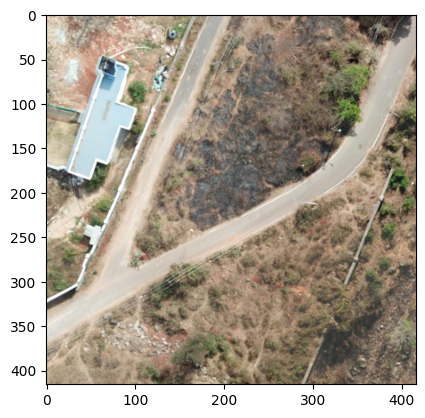

1/1 [==============================] - 0s 162ms/step
[]
(1000, 1000, 3)
showing rotated image


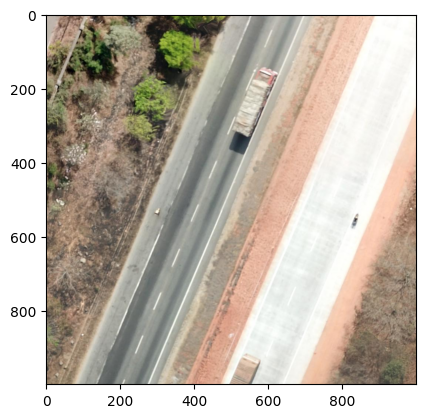

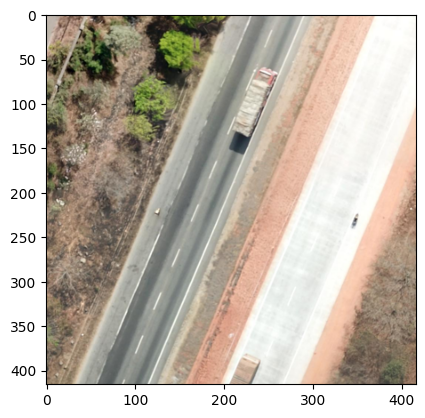

1/1 [==============================] - 0s 167ms/step
[[327, 389, 494, 533, 71.07138633728027]]
(1000, 1000, 3)


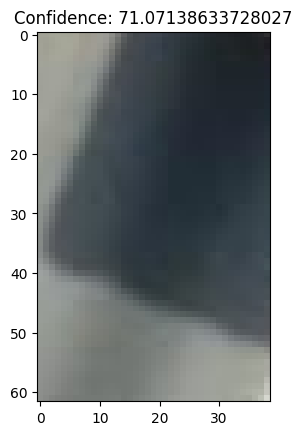

showing rotated image


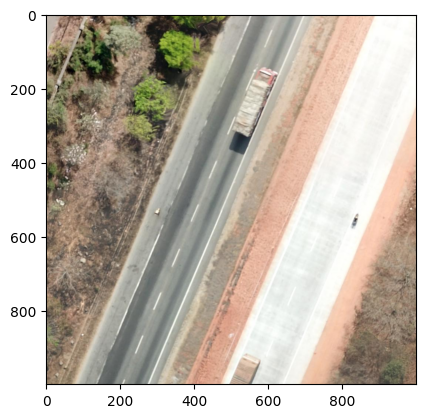

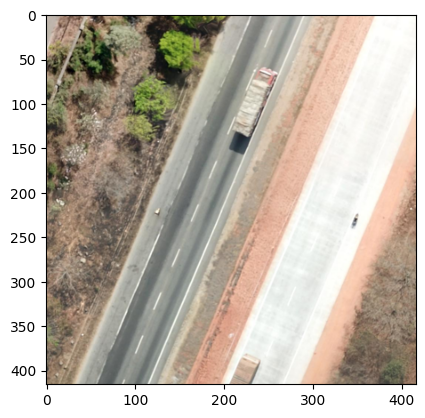

1/1 [==============================] - 0s 169ms/step
[[327, 389, 494, 533, 71.07138633728027]]
(1000, 1000, 3)


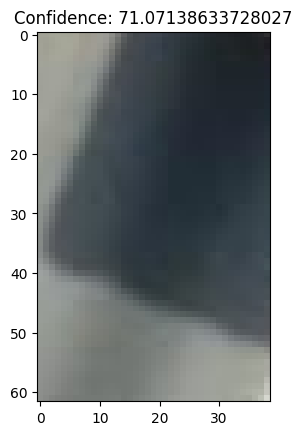

showing rotated image


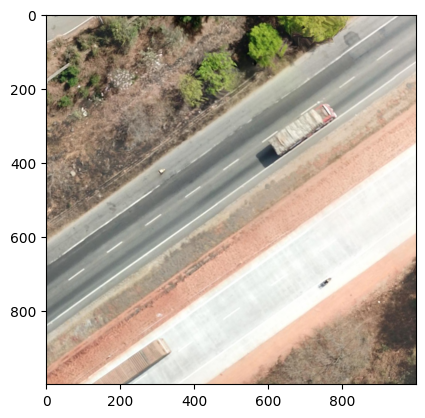

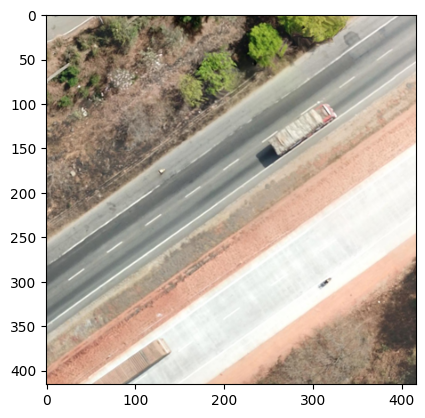

1/1 [==============================] - 0s 172ms/step
[[364, 418, 569, 616, 71.42465710639954]]
(1000, 1000, 3)


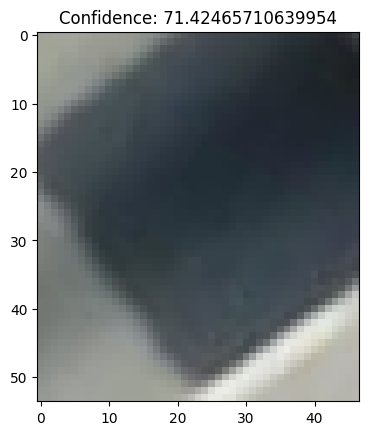

showing rotated image


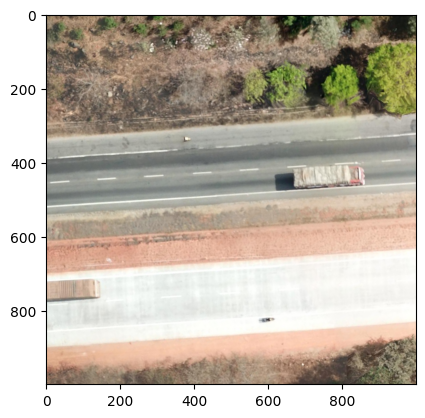

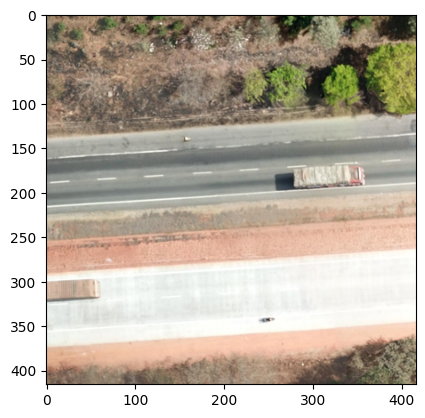

1/1 [==============================] - 0s 164ms/step
[]
(1000, 1000, 3)
showing rotated image


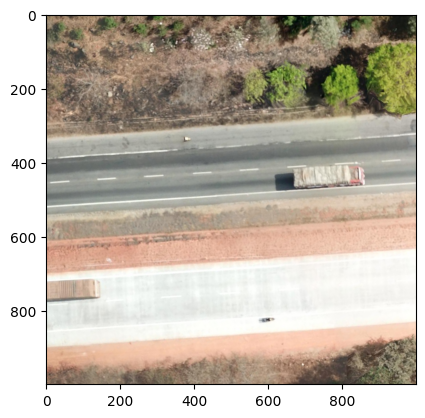

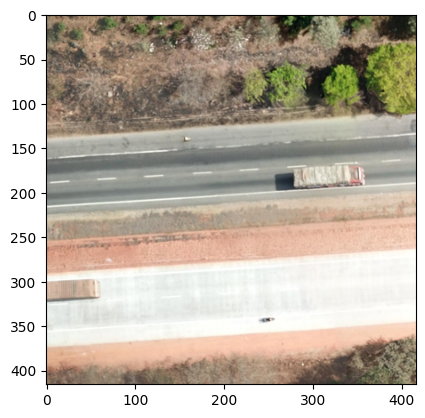

1/1 [==============================] - 0s 175ms/step
[]
(1000, 1000, 3)
showing rotated image


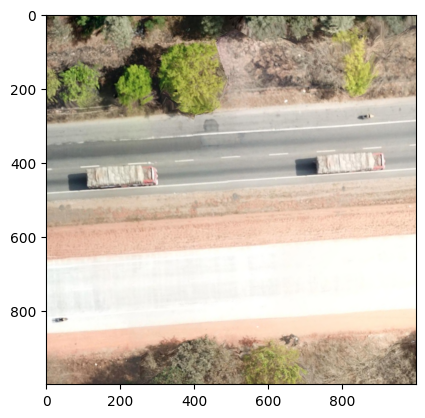

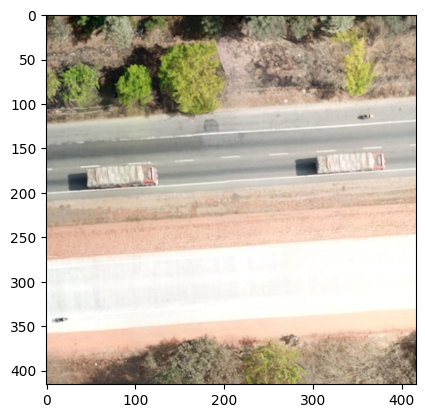

1/1 [==============================] - 0s 170ms/step
[[404, 439, 674, 733, 90.45959115028381]]
(1000, 1000, 3)


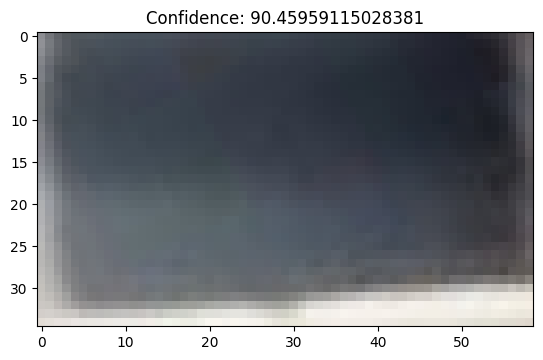

showing rotated image


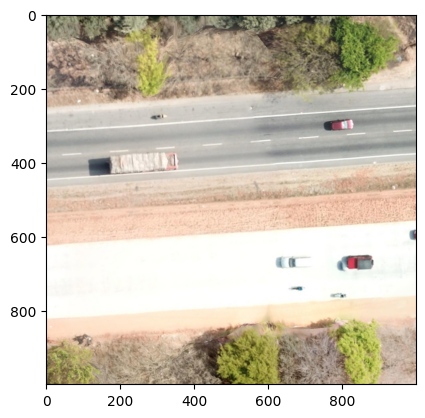

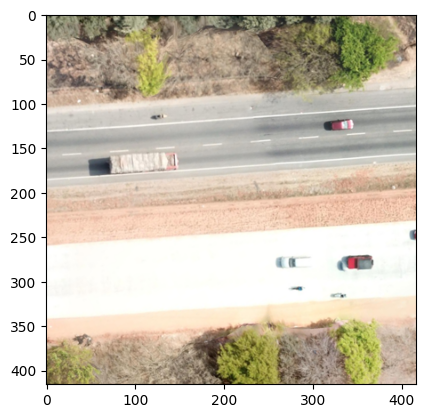

1/1 [==============================] - 0s 165ms/step
[[299, 327, 760, 831, 99.99527931213379], [392, 430, 113, 175, 79.79341149330139]]
(1000, 1000, 3)


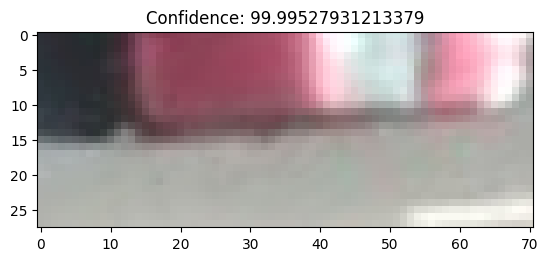

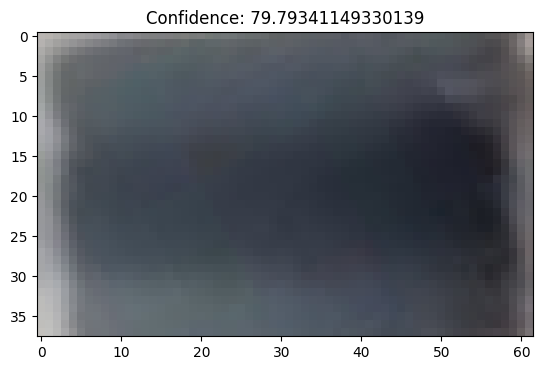

showing rotated image


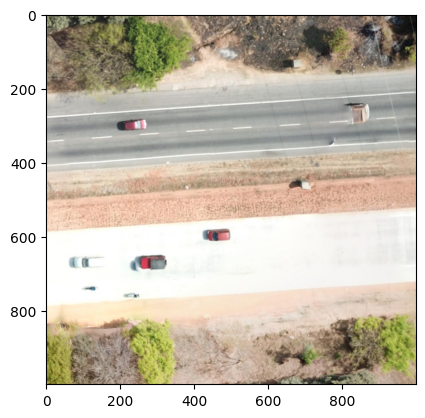

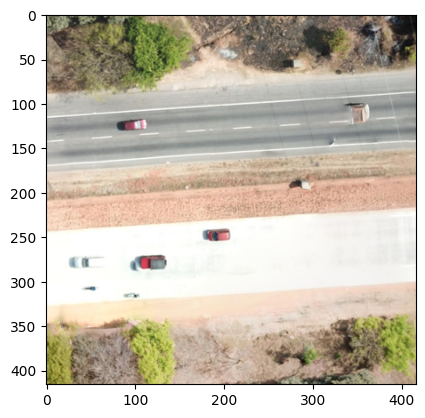

1/1 [==============================] - 0s 169ms/step
[[288, 316, 199, 273, 99.99920129776001], [590, 623, 431, 507, 83.7321400642395]]
(1000, 1000, 3)


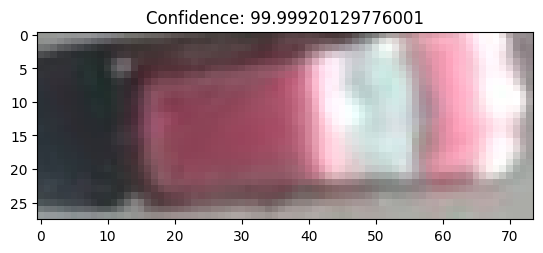

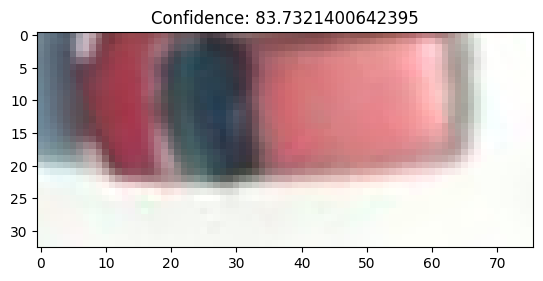

showing rotated image


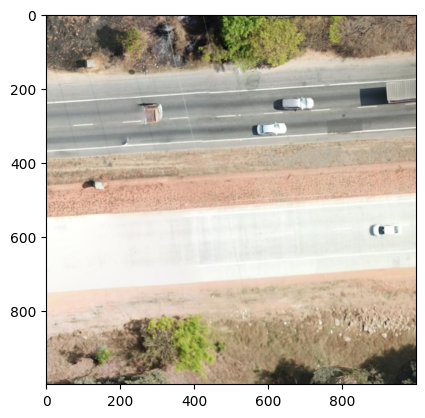

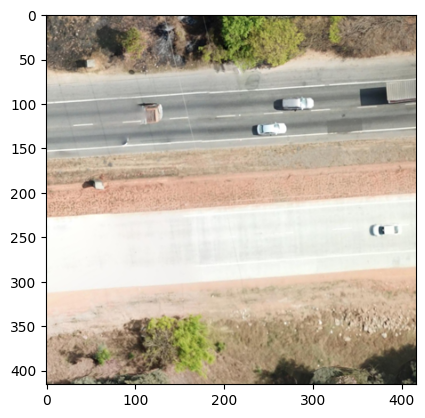

1/1 [==============================] - 0s 174ms/step
[[218, 252, 850, 913, 89.55021500587463], [238, 266, 640, 724, 99.61356520652771], [308, 336, 570, 648, 99.98669624328613]]
(1000, 1000, 3)


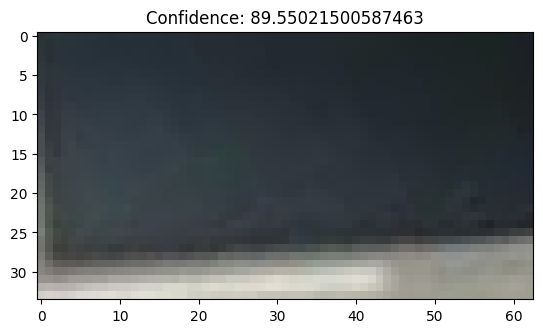

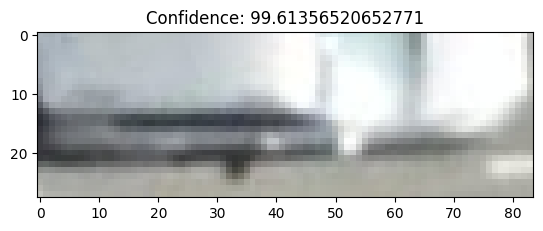

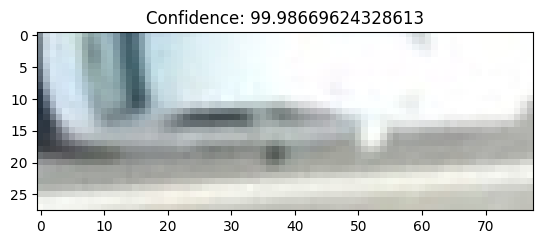

In [21]:
img_layer = ImageProcessingLayer(mock_wait_time=1)
# obj_layer = KerasObjectDetectionLayerTest()
obj_layer = KerasObjectDetectionLayer()
mav_layer = MavlinkInterfaceLayer()

detections = []

index = 0
for img, img_corner_gps_coords in img_layer.run():
    print("showing rotated image")
    plt.imshow(img)
    plt.show()
    
    newImg1 = Image.fromarray(img)
    newImg1.save(f"img{index}.png")
    
    index = index + 1
    if index == 20:
        break
        
    bboxes = obj_layer.run(img)
#     mav_layer.run(bboxes)
    
    detections.append((img_corner_gps_coords, bboxes))
    print(bboxes)
    print(img.shape)
    for bbox in bboxes:
        plt.imshow(img[bbox[0]:bbox[1], bbox[2]:bbox[3]])
        plt.title("Confidence: {}".format(bbox[4]))
        plt.show()

## Bounding box corner coordinate conversion

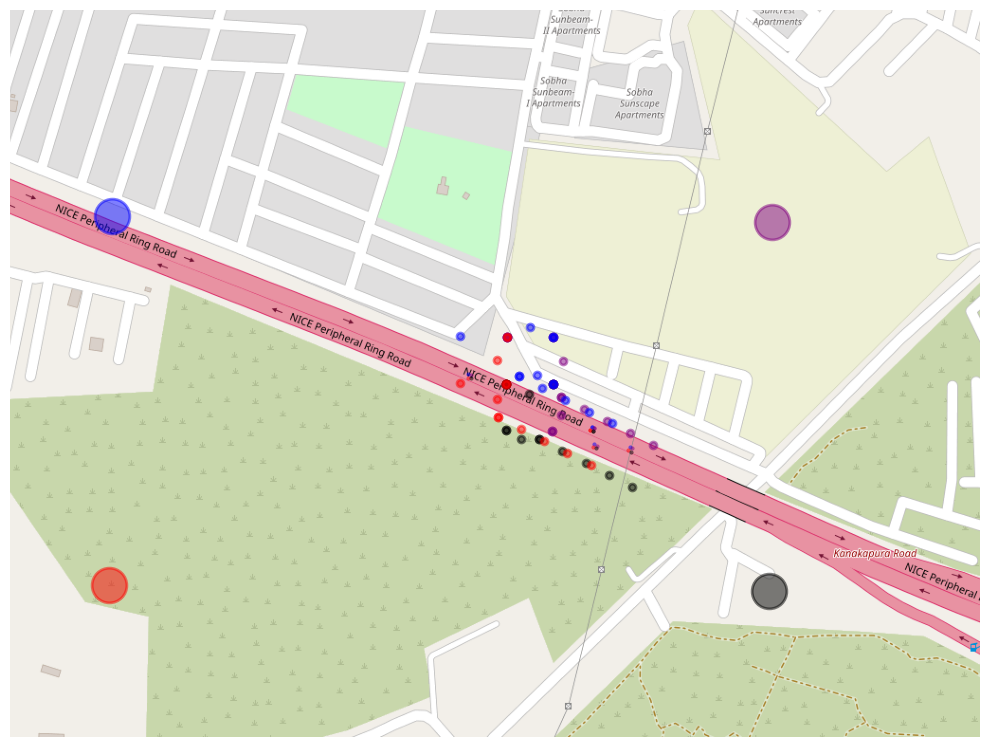

In [16]:
map = smopy.Map((min_lat,min_lon,max_lat,max_lon), z=17)
ax = map.show_mpl(figsize=(10, 10))

# [top left, top right, bottom left, bottom right]
corner_colors = ["blue", "purple", "red", "black"]

# Print dataset corners
for index, dataset_corner_gps in enumerate(DATASET_CORNER_GPS_COORDS):
    dataset_corner_gps = (dataset_corner_gps[0], dataset_corner_gps[1])
    x, y = map.to_pixels(dataset_corner_gps)
    ax.plot(x, y, 'o', ms=25, mew=2, alpha=0.5, color=corner_colors[index]);
    
# Print corners of each sample image
for sample_corner_gps_coords in sample_corner_gps_coords_list:
    for index, sample_corner_gps in enumerate(sample_corner_gps_coords):
        sample_corner_gps = (sample_corner_gps[0], sample_corner_gps[1])
        x, y = map.to_pixels(sample_corner_gps)
        ax.plot(x, y, 'o', ms=5, mew=2, alpha=0.5, color=corner_colors[index]);
    
# Print corners of each bounding box
for bb_corner_gps_coords in bb_corner_gps_coords_list:
    for index, bb_corner_gps in enumerate(bb_corner_gps_coords):
        bb_corner_gps = (bb_corner_gps[0], bb_corner_gps[1])
        x, y = map.to_pixels(bb_corner_gps)
        ax.plot(x, y, 'o', ms=1, mew=2, alpha=0.5, color=corner_colors[index]);

In [14]:
base_coordinates = np.array(DATASET_CORNER_GPS_COORDS)

min_lat = min(base_coordinates[:,0])
max_lat = max(base_coordinates[:,0])
min_lon = min(base_coordinates[:,1])
max_lon = max(base_coordinates[:,1])

In [13]:
import smopy

# Smopy Visualization

In [12]:
# Print GPS coordinates of corners of each bounding box
for corner_gps_coords in bb_corner_gps_coords_list:
    for coord in corner_gps_coords:
        print(f"({coord[0]:0.5f}, {coord[1]:0.5f})", end=', ')
    print()

(12.86133, 77.51922), (12.86133, 77.51926), (12.86129, 77.51922), (12.86129, 77.51926), 
(12.86075, 77.52062), (12.86073, 77.52065), (12.86072, 77.52061), (12.86071, 77.52064), 
(12.86075, 77.52063), (12.86073, 77.52065), (12.86072, 77.52061), (12.86071, 77.52064), 
(12.86056, 77.52066), (12.86054, 77.52069), (12.86053, 77.52064), (12.86051, 77.52067), 
(12.86053, 77.52106), (12.86051, 77.52109), (12.86049, 77.52104), (12.86048, 77.52107), 


In [11]:
bb_corner_gps_coords_list = []
sample_corner_gps_coords_list = []

for detection in detections:
    sample_corner_gps_coords = detection[0]
    width = OUTPUT_DIM[1]
    height = OUTPUT_DIM[0]

    sample_pixel_to_gps_transform = get_pixel_to_gps_transform(sample_corner_gps_coords, width, height)
    sample_bb_corner_gps_coords_list = []
    for bb_pixel_coords in detection[1]:
        top_left_corner_pixel = (bb_pixel_coords[2], bb_pixel_coords[0])
        top_right_corner_pixel = (bb_pixel_coords[3], bb_pixel_coords[0])
        bot_left_corner_pixel = (bb_pixel_coords[2], bb_pixel_coords[1])
        bot_right_corner_pixel = (bb_pixel_coords[3], bb_pixel_coords[1])

        top_left_corner_gps = sample_pixel_to_gps_transform(top_left_corner_pixel)
        top_right_corner_gps = sample_pixel_to_gps_transform(top_right_corner_pixel)
        bot_left_corner_gps = sample_pixel_to_gps_transform(bot_left_corner_pixel)
        bot_right_corner_gps = sample_pixel_to_gps_transform(bot_right_corner_pixel)

        coords = top_left_corner_gps, top_right_corner_gps, bot_left_corner_gps, bot_right_corner_gps
        sample_bb_corner_gps_coords_list.append(coords)
    bb_corner_gps_coords_list.extend(sample_bb_corner_gps_coords_list)
    sample_corner_gps_coords_list.append(sample_corner_gps_coords)
